# Importing and cleaning data

In [141]:
# Import dependencies
from sklearn import tree
import pandas as pd
import numpy as np
import os
import warnings
warnings.filterwarnings("ignore")

In [142]:
# path = '/Users/aqian/Downloads/'
# #path = 'M:/Edmund'
# os.chdir(path)
df = pd.read_csv("../../NRD 2013 (machine learning).csv")
df.head()

,index,age,aweekend,died,discwt,dispuniform,dmonth,dqtr,drg,drgver,...,_Iage_group_1,_Iage_group_2,_Inew_cc_in_1,_Inew_cc_in_2,_Ipayer_2,_Ipayer_3,_Ipayer_4,_Izipinc_qr_2,_Izipinc_qr_3,_Izipinc_qr_4
0,0,89,1,0.0,1.071937,5.0,3,1,372,30,...,0,1,0,1,0.0,0.0,0.0,0.0,0.0,1.0
1,1,89,1,0.0,1.071937,1.0,6,2,853,30,...,0,1,0,1,0.0,0.0,0.0,0.0,0.0,1.0
2,2,89,0,0.0,1.071937,5.0,9,3,853,30,...,0,1,1,0,0.0,0.0,0.0,0.0,0.0,1.0
3,3,48,0,0.0,3.063669,1.0,6,2,330,30,...,1,0,0,0,1.0,0.0,0.0,0.0,1.0,0.0
4,4,65,0,0.0,1.919980,1.0,5,2,387,30,...,0,1,0,0,0.0,0.0,0.0,1.0,0.0,0.0


In [143]:
# List all of the column names
print(df.columns.values)

['index' 'age' 'aweekend' 'died' 'discwt' 'dispuniform' 'dmonth' 'dqtr'
 'drg' 'drgver' 'drg_nopoa' 'dx1' 'dx2' 'dx3' 'dx4' 'dx5' 'dx6' 'dx7'
 'dx8' 'dx9' 'dx10' 'dx11' 'dx12' 'dx13' 'dx14' 'dx15' 'dx16' 'dx17'
 'dx18' 'dx19' 'dx20' 'dx21' 'dx22' 'dx23' 'dx24' 'dx25' 'dxccs1' 'dxccs2'
 'dxccs3' 'dxccs4' 'dxccs5' 'dxccs6' 'dxccs7' 'dxccs8' 'dxccs9' 'dxccs10'
 'dxccs11' 'dxccs12' 'dxccs13' 'dxccs14' 'dxccs15' 'dxccs16' 'dxccs17'
 'dxccs18' 'dxccs19' 'dxccs20' 'dxccs21' 'dxccs22' 'dxccs23' 'dxccs24'
 'dxccs25' 'elective' 'female' 'hcup_ed' 'hosp_nrd' 'key_nrd' 'los' 'mdc'
 'mdc_nopoa' 'nchronic' 'ndx' 'necode' 'npr' 'nrd_daystoevent'
 'nrd_stratum' 'nrd_visitlink' 'orproc' 'pay1' 'pl_nchs' 'pr1' 'pr2' 'pr3'
 'pr4' 'pr5' 'pr6' 'pr7' 'pr8' 'pr9' 'pr10' 'pr11' 'pr12' 'pr13' 'pr14'
 'pr15' 'prccs1' 'prccs2' 'prccs3' 'prccs4' 'prccs5' 'prccs6' 'prccs7'
 'prccs8' 'prccs9' 'prccs10' 'prccs11' 'prccs12' 'prccs13' 'prccs14'
 'prccs15' 'rehabtransfer' 'resident' 'samedayevent' 'totchg' 'year'
 'zip

In [144]:
df['ibd_specific_adm']

0        0
1        0
2        0
3        1
4        1
        ..
94493    1
94494    0
94495    0
94496    0
94497    1
Name: ibd_specific_adm, Length: 94498, dtype: int64

In [145]:
# Check the top 5 rows
df.head() 

,index,age,aweekend,died,discwt,dispuniform,dmonth,dqtr,drg,drgver,...,_Iage_group_1,_Iage_group_2,_Inew_cc_in_1,_Inew_cc_in_2,_Ipayer_2,_Ipayer_3,_Ipayer_4,_Izipinc_qr_2,_Izipinc_qr_3,_Izipinc_qr_4
0,0,89,1,0.0,1.071937,5.0,3,1,372,30,...,0,1,0,1,0.0,0.0,0.0,0.0,0.0,1.0
1,1,89,1,0.0,1.071937,1.0,6,2,853,30,...,0,1,0,1,0.0,0.0,0.0,0.0,0.0,1.0
2,2,89,0,0.0,1.071937,5.0,9,3,853,30,...,0,1,1,0,0.0,0.0,0.0,0.0,0.0,1.0
3,3,48,0,0.0,3.063669,1.0,6,2,330,30,...,1,0,0,0,1.0,0.0,0.0,0.0,1.0,0.0
4,4,65,0,0.0,1.919980,1.0,5,2,387,30,...,0,1,0,0,0.0,0.0,0.0,1.0,0.0,0.0


In [146]:
# Make a copy of the dataframe
df_copy = df.copy()
df_copy.head()

,index,age,aweekend,died,discwt,dispuniform,dmonth,dqtr,drg,drgver,...,_Iage_group_1,_Iage_group_2,_Inew_cc_in_1,_Inew_cc_in_2,_Ipayer_2,_Ipayer_3,_Ipayer_4,_Izipinc_qr_2,_Izipinc_qr_3,_Izipinc_qr_4
0,0,89,1,0.0,1.071937,5.0,3,1,372,30,...,0,1,0,1,0.0,0.0,0.0,0.0,0.0,1.0
1,1,89,1,0.0,1.071937,1.0,6,2,853,30,...,0,1,0,1,0.0,0.0,0.0,0.0,0.0,1.0
2,2,89,0,0.0,1.071937,5.0,9,3,853,30,...,0,1,1,0,0.0,0.0,0.0,0.0,0.0,1.0
3,3,48,0,0.0,3.063669,1.0,6,2,330,30,...,1,0,0,0,1.0,0.0,0.0,0.0,1.0,0.0
4,4,65,0,0.0,1.919980,1.0,5,2,387,30,...,0,1,0,0,0.0,0.0,0.0,1.0,0.0,0.0


In [147]:
# Check the back end of the data
df_copy.tail()

,index,age,aweekend,died,discwt,dispuniform,dmonth,dqtr,drg,drgver,...,_Iage_group_1,_Iage_group_2,_Inew_cc_in_1,_Inew_cc_in_2,_Ipayer_2,_Ipayer_3,_Ipayer_4,_Izipinc_qr_2,_Izipinc_qr_3,_Izipinc_qr_4
94493,94493,44,0,0.0,1.669010,6.0,6,2,331,30,...,1,0,0,0,1.0,0.0,0.0,0.0,0.0,1.0
94494,94494,44,0,0.0,1.669010,1.0,8,3,346,30,...,1,0,0,0,1.0,0.0,0.0,0.0,0.0,1.0
94495,94495,44,0,0.0,1.669010,1.0,8,3,393,30,...,1,0,0,0,1.0,0.0,0.0,0.0,0.0,1.0
94496,94496,52,0,0.0,1.863343,1.0,2,1,472,30,...,1,0,0,1,0.0,0.0,0.0,0.0,0.0,0.0
94497,94497,72,1,0.0,1.771707,1.0,2,1,385,30,...,0,1,1,0,0.0,0.0,0.0,1.0,0.0,0.0


In [148]:
# Check the data 
# Looks like the ibd_readm variables contains "NA" values

df_copy[['nrd_visitlink','ibd_index_hosp', 'dx1', 'new_mi_adm', 'ibd_readm']].head()

,nrd_visitlink,ibd_index_hosp,dx1,new_mi_adm,ibd_readm
0,00017u,1,00845,0,0
1,00017u,0,0389,0,1
2,00017u,0,03842,0,1
3,0004o5,1,5559,0,0
4,000dbz,1,5559,0,0


In [149]:
# Recoding the ibd_readm outcome variable
readm_set = set()
for index, row in df_copy[['nrd_visitlink','ibd_readm']].iterrows():
    if row[1] == 1:
        readm_set.add(row[0])
        
readm_list = list(readm_set)

df_copy.loc[df_copy.nrd_visitlink.isin(readm_list), 'ibd_readm'] = '1'
df_copy[['nrd_visitlink','ibd_index_hosp', 'ibd_readm']].head(15)

,nrd_visitlink,ibd_index_hosp,ibd_readm
0,00017u,1,1
1,00017u,0,1
2,00017u,0,1
3,0004o5,1,0
4,000dbz,1,1
5,000dbz,0,1
6,000dbz,0,1
7,000dbz,0,1
8,000dbz,0,1
9,000mgu,1,0


In [150]:
df_copy[['nrd_visitlink', 'pay1', 'ibd_index_hosp', 'ibd_readm']].head(15)

,nrd_visitlink,pay1,ibd_index_hosp,ibd_readm
0,00017u,1.0,1,1
1,00017u,1.0,0,1
2,00017u,1.0,0,1
3,0004o5,3.0,1,0
4,000dbz,1.0,1,1
5,000dbz,1.0,0,1
6,000dbz,1.0,0,1
7,000dbz,1.0,0,1
8,000dbz,1.0,0,1
9,000mgu,3.0,1,0


In [151]:
# Number of index hospitalizations
index_hosp_counts = df_copy['ibd_index_hosp'].value_counts()
index_hosp_counts

1    47402
0    47096
Name: ibd_index_hosp, dtype: int64

In [152]:
# Number of readmissions within six months
readm_counts = df_copy['ibd_readm'].value_counts()
readm_counts

1    64373
0    30125
Name: ibd_readm, dtype: int64

In [153]:
# Filter the data so that only patients with an index hospitalizations are in a DataFrame
readm_data_df = df_copy.loc[df_copy["ibd_index_hosp"] == 1, :]

# Check to ensure the filter worked correctly
readm_data_df["ibd_index_hosp"].count()

47402

In [154]:
# Creating deciles by length of follow-up normalized by number of hospitalizations 
readm_data_df['ibd_deciles'] = pd.qcut(readm_data_df['ibdtotlos_alive_fu'], 10, labels=np.arange(10, 0, -1))

readm_data_df.head(15)

,index,age,aweekend,died,discwt,dispuniform,dmonth,dqtr,drg,drgver,...,_Iage_group_2,_Inew_cc_in_1,_Inew_cc_in_2,_Ipayer_2,_Ipayer_3,_Ipayer_4,_Izipinc_qr_2,_Izipinc_qr_3,_Izipinc_qr_4,ibd_deciles
0,0,89,1,0.0,1.071937,5.0,3,1,372,30,...,1,0,1,0.0,0.0,0.0,0.0,0.0,1.0,2
3,3,48,0,0.0,3.063669,1.0,6,2,330,30,...,0,0,0,1.0,0.0,0.0,0.0,1.0,0.0,6
4,4,65,0,0.0,1.919980,1.0,5,2,387,30,...,1,0,0,0.0,0.0,0.0,1.0,0.0,0.0,1
9,9,51,0,0.0,2.958993,1.0,3,1,354,30,...,0,0,0,1.0,0.0,0.0,0.0,0.0,1.0,8
10,10,22,0,0.0,3.109660,1.0,1,1,330,30,...,0,0,0,0.0,0.0,0.0,1.0,0.0,0.0,6
11,11,33,1,0.0,1.061258,1.0,1,1,313,30,...,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,3
19,19,84,0,0.0,2.155742,6.0,5,2,690,30,...,1,0,0,0.0,0.0,0.0,0.0,0.0,1.0,3
22,22,62,0,0.0,1.863343,5.0,2,1,853,30,...,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,3
23,23,40,0,0.0,1.509554,1.0,3,1,389,30,...,0,0,0,1.0,0.0,0.0,0.0,0.0,1.0,1
30,30,68,1,0.0,2.148695,6.0,5,2,854,30,...,1,0,1,0.0,0.0,0.0,0.0,0.0,1.0,5


In [155]:
# Check for null values
df_copy.isnull().sum()

index               0
age                 0
aweekend            0
died               24
discwt              0
                 ... 
_Ipayer_3         102
_Ipayer_4         102
_Izipinc_qr_2    1414
_Izipinc_qr_3    1414
_Izipinc_qr_4    1414
Length: 362, dtype: int64

In [156]:
# Generate a new variable to identify high-need, high-cost patients

def topDecile(series):
    if series == 1:
        return 1
    else:
        return 0
        
readm_data_df['hnhc_patients'] = readm_data_df['ibd_deciles'].apply(topDecile)

readm_data_df.tail(25)

,index,age,aweekend,died,discwt,dispuniform,dmonth,dqtr,drg,drgver,...,_Inew_cc_in_1,_Inew_cc_in_2,_Ipayer_2,_Ipayer_3,_Ipayer_4,_Izipinc_qr_2,_Izipinc_qr_3,_Izipinc_qr_4,ibd_deciles,hnhc_patients
94449,94449,80,1,0.0,2.148695,1.0,2,1,386,30,...,0,0,0.0,0.0,0.0,1.0,0.0,0.0,5,0
94451,94451,38,0,0.0,1.700426,1.0,2,1,775,30,...,0,0,1.0,0.0,0.0,0.0,0.0,1.0,8,0
94452,94452,56,1,0.0,4.491267,5.0,3,1,439,30,...,0,0,0.0,0.0,0.0,0.0,0.0,1.0,2,0
94455,94455,41,0,0.0,3.371811,1.0,1,1,392,30,...,0,0,1.0,0.0,0.0,0.0,1.0,0.0,10,0
94456,94456,35,0,0.0,1.551591,1.0,2,1,237,30,...,0,1,1.0,0.0,0.0,0.0,0.0,0.0,2,0
94457,94457,59,0,0.0,1.995433,1.0,1,1,683,30,...,0,1,1.0,0.0,0.0,0.0,1.0,0.0,1,1
94459,94459,20,0,0.0,2.243069,1.0,1,1,386,30,...,0,0,1.0,0.0,0.0,1.0,0.0,0.0,7,0
94461,94461,90,0,0.0,3.387816,1.0,4,2,309,30,...,0,1,0.0,0.0,0.0,1.0,0.0,0.0,8,0
94462,94462,19,0,0.0,2.275446,1.0,2,1,386,30,...,1,0,1.0,0.0,0.0,0.0,0.0,0.0,1,1
94465,94465,76,0,0.0,3.871441,5.0,5,2,470,30,...,0,0,0.0,0.0,0.0,0.0,0.0,0.0,7,0


In [157]:
# Create new features using isin function

# steroid use - V5865
readm_data_df['steroid_use'] = readm_data_df[['dx1', 'dx2', 'dx3', 'dx4', 'dx5', 'dx6', 'dx7', 'dx8', 'dx9', 'dx10',
               'dx11', 'dx12', 'dx13', 'dx14', 'dx15', 'dx16', 'dx17', 'dx18', 'dx19',
               'dx20', 'dx21', 'dx22', 'dx23', 'dx24', 'dx25']].isin(['V5865']).any(axis=1).astype(int)

# abdominal pain - 78900
readm_data_df['abd_pain_adm'] = readm_data_df[['dx1', 'dx2', 'dx3', 'dx4', 'dx5', 'dx6', 'dx7', 'dx8', 'dx9', 'dx10',
               'dx11', 'dx12', 'dx13', 'dx14', 'dx15', 'dx16', 'dx17', 'dx18', 'dx19',
               'dx20', 'dx21', 'dx22', 'dx23', 'dx24', 'dx25']].isin(['78900']).any(axis=1).astype(int)

# acute kidney injury - 5849
readm_data_df['aki_adm'] = readm_data_df[['dx1', 'dx2', 'dx3', 'dx4', 'dx5', 'dx6', 'dx7', 'dx8', 'dx9', 'dx10',
               'dx11', 'dx12', 'dx13', 'dx14', 'dx15', 'dx16', 'dx17', 'dx18', 'dx19',
               'dx20', 'dx21', 'dx22', 'dx23', 'dx24', 'dx25']].isin(['5849']).any(axis=1).astype(int)

# gi bleed - 5789
readm_data_df['gi_bleed_adm'] = readm_data_df[['dx1', 'dx2', 'dx3', 'dx4', 'dx5', 'dx6', 'dx7', 'dx8', 'dx9', 'dx10',
               'dx11', 'dx12', 'dx13', 'dx14', 'dx15', 'dx16', 'dx17', 'dx18', 'dx19',
               'dx20', 'dx21', 'dx22', 'dx23', 'dx24', 'dx25']].isin(['5789']).any(axis=1).astype(int)

readm_data_df.head(25)


,index,age,aweekend,died,discwt,dispuniform,dmonth,dqtr,drg,drgver,...,_Ipayer_4,_Izipinc_qr_2,_Izipinc_qr_3,_Izipinc_qr_4,ibd_deciles,hnhc_patients,steroid_use,abd_pain_adm,aki_adm,gi_bleed_adm
0,0,89,1,0.0,1.071937,5.0,3,1,372,30,...,0.0,0.0,0.0,1.0,2,0,0,0,0,0
3,3,48,0,0.0,3.063669,1.0,6,2,330,30,...,0.0,0.0,1.0,0.0,6,0,0,0,0,0
4,4,65,0,0.0,1.919980,1.0,5,2,387,30,...,0.0,1.0,0.0,0.0,1,1,0,0,0,0
9,9,51,0,0.0,2.958993,1.0,3,1,354,30,...,0.0,0.0,0.0,1.0,8,0,0,0,0,0
10,10,22,0,0.0,3.109660,1.0,1,1,330,30,...,0.0,1.0,0.0,0.0,6,0,0,0,0,0
11,11,33,1,0.0,1.061258,1.0,1,1,313,30,...,0.0,0.0,0.0,0.0,3,0,0,0,0,0
19,19,84,0,0.0,2.155742,6.0,5,2,690,30,...,0.0,0.0,0.0,1.0,3,0,0,0,0,0
22,22,62,0,0.0,1.863343,5.0,2,1,853,30,...,0.0,0.0,0.0,0.0,3,0,0,0,1,0
23,23,40,0,0.0,1.509554,1.0,3,1,389,30,...,0.0,0.0,0.0,1.0,1,1,1,1,0,0
30,30,68,1,0.0,2.148695,6.0,5,2,854,30,...,0.0,0.0,0.0,1.0,5,0,0,0,1,0


In [158]:
# export to CSV
readm_data_df.to_csv("IBD_readm_data_for_Tableau.csv")

In [159]:
# Intially run with entire feature list so RFE can use backwards selection to pick top features
data = readm_data_df[['hnhc_patients', 'steroid_use', 'abd_pain_adm', 'aki_adm', 'gi_bleed_adm',
 'age',
 'female',
 'los',
 'aweekend',
 'elective',
 'orproc',
 'hosp_urban_rural_location',
 'payer',
 'zipinc_qrtl',
 'severe_IBD_hospitalization',
 'cm_aids',
 'cm_alcohol',
 'cm_anemdef',
 'cm_arth',
 'cm_bldloss',
 'cm_chf',
 'cm_chrnlung',
 'cm_depress',
 'cm_coag',
 'cm_dm',
 'cm_dmcx',
 'cm_drug',
 'cm_htn_c',
 'cm_hypothy',
 'cm_liver',
 'cm_lymph',
 'cm_lytes',
 'cm_mets',
 'cm_neuro',
 'cm_obese',
 'cm_para',
 'cm_perivasc',
 'cm_psych',
 'cm_pulmcirc',
 'cm_renlfail',
 'cm_tumor',
 'cm_ulcer',
 'cm_valve',
 'cm_wghtloss',
 'diabetes',
 'copd',
 'cm_smoking',
 'blood_transfusion',
 'ibd_procedures',
 'cc_index',
 'new_cc_index',
 'fractures',
 'thromboses',
 'unplanned_adm',
 'pq1_dm_short',
 'pq2_perf_appendix',
 'pq3_dm_long',
 'pq5_copd_asthma',
 'pq7_htn',
 'pq8_chf',
 'pq10_dehydrate',
 'pq11_bacterialpna',
 'pq12_uti',
 'pq13_angina',
 'pq14_diabeteswocomp',
 'pq15_asthma',
 'pq16_dm_amputate',
 'new_mi_adm',
 'new_chf_adm',
 'new_unstableangina_adm',
 'new_arrhythmia_adm',
 'new_cardiacarrest_adm',
 'new_meningitis_adm',
 'new_encephalitis_adm',
 'new_endocarditis_adm',
 'new_pneumonia_adm',
 'new_pyelonephritis_adm',
 'new_osteo_adm',
 'new_septicemia_adm',
 'new_cdiff_adm',
 'new_tb_adm',
 'new_atypicalmyco_adm',
 'new_fungal_adm',
 'new_listeriosis_adm',
 'new_leishmaniasis_adm',
 'new_pcp_adm',
 'chronic_pain',
 'ibd_surgery_adm',
 'frailty_risk_score',
 'frailty_risk_category_index',
 'h_contrl',
 'hosp_bedsize',
 'hosp_ur_teach',
 'hosp_urcat4',
 'prevent_readm',
 'cardiac_adm',
 'cvd_adm',
 'resp_adm',
 'infxn_adm',
 'gu_adm',
 'gi_adm',
 'endo_adm',
 'neuro_adm',
 'malignancies_adm',
 'fracture_adm',
 'thrombosis_adm',
 'ibd_specific_adm',
 'others_adm']]

cleaned_data = data.dropna(axis='rows')
cleaned_data

,hnhc_patients,steroid_use,abd_pain_adm,aki_adm,gi_bleed_adm,age,female,los,aweekend,elective,...,infxn_adm,gu_adm,gi_adm,endo_adm,neuro_adm,malignancies_adm,fracture_adm,thrombosis_adm,ibd_specific_adm,others_adm
0,0,0,0,0,0,89,0,4,1,0.0,...,1,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,48,1,4,0,1.0,...,0,0,0,0,0,0,0,0,1,0
4,1,0,0,0,0,65,0,5,0,0.0,...,0,0,0,0,0,0,0,0,1,0
9,0,0,0,0,0,51,0,3,0,0.0,...,0,0,1,0,0,0,0,0,0,0
10,0,0,0,0,0,22,0,6,0,1.0,...,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
94491,0,0,0,0,0,32,1,3,1,0.0,...,0,0,0,0,0,0,0,0,0,0
94492,0,0,0,0,0,54,0,4,0,1.0,...,0,0,1,0,0,0,0,0,0,0
94493,1,0,0,0,0,44,0,9,0,1.0,...,0,0,0,0,0,0,0,0,1,0
94496,0,0,0,0,0,52,1,2,0,1.0,...,0,0,0,0,0,0,0,0,0,0


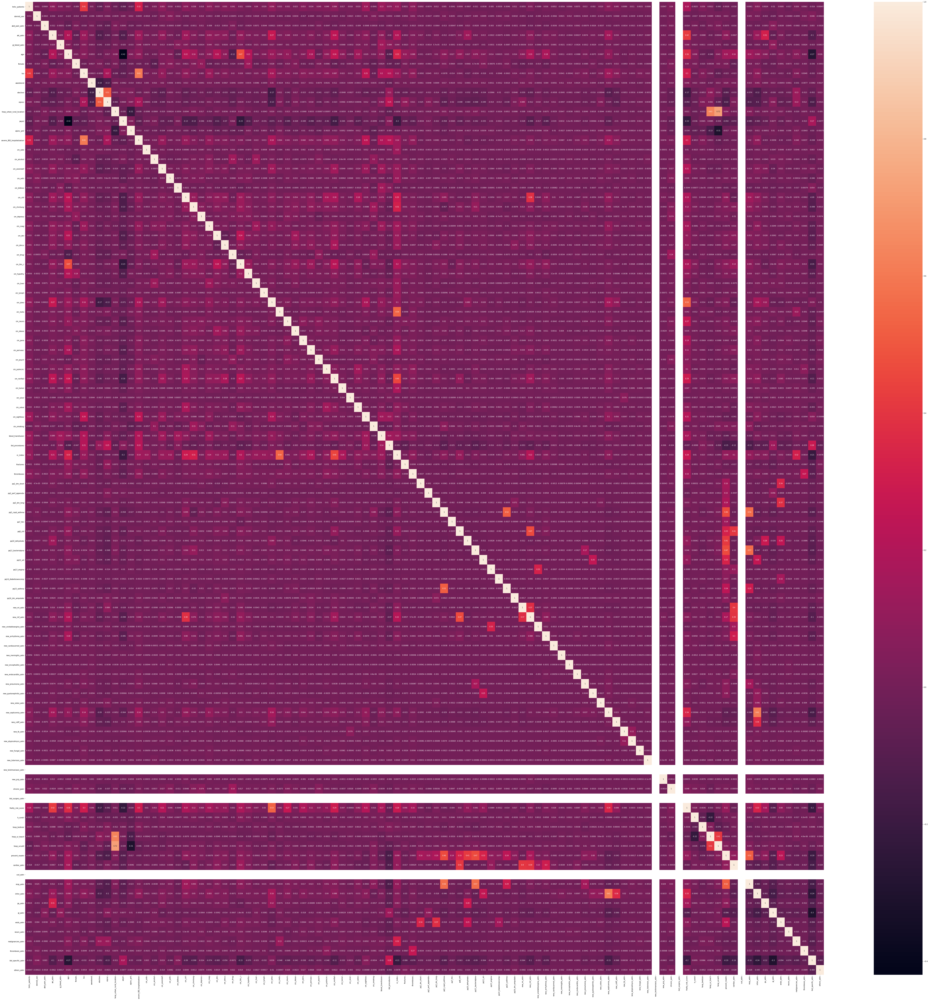

In [94]:
# Correlation matrix
corrMatrix = cleaned_data.corr()

# Generating a heatmap
import seaborn as sn
import matplotlib.pyplot as plt

# Plot the matrix
fig, ax = plt.subplots(figsize=(105,105))   # Sample figsize in inches
sn.heatmap(corrMatrix, annot=True)
plt.show()

In [160]:
# Removing correlated features
correlated_features = set()
correlation_matrix = cleaned_data.drop('hnhc_patients', axis=1).corr()

for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > 0.75:
            colname = correlation_matrix.columns[i]
            correlated_features.add(colname)

In [161]:
# Drop these features
correlated_features

{'copd',
 'diabetes',
 'fracture_adm',
 'frailty_risk_category_index',
 'new_cc_index',
 'unplanned_adm'}

In [162]:
# Grab outcome/label names after dropping na's/rows with na's
target = cleaned_data["hnhc_patients"]
target_names = ["none", "hnhc"]
target = target.astype('int64')
target

0        0
3        0
4        1
9        0
10       0
        ..
94491    0
94492    0
94493    1
94496    0
94497    0
Name: hnhc_patients, Length: 46586, dtype: int64

In [163]:
# Grab feature names after dropping na's/rows with na, also drop the correlated features
cleaned_data_wo_outcome = cleaned_data.drop(['hnhc_patients','copd',
 'diabetes',
 'fracture_adm',
 'frailty_risk_category_index',
 'new_cc_index',
 'unplanned_adm'], axis=1)
featured_names = cleaned_data_wo_outcome.columns
featured_names

Index(['steroid_use', 'abd_pain_adm', 'aki_adm', 'gi_bleed_adm', 'age',
       'female', 'los', 'aweekend', 'elective', 'orproc',
       ...
       'resp_adm', 'infxn_adm', 'gu_adm', 'gi_adm', 'endo_adm', 'neuro_adm',
       'malignancies_adm', 'thrombosis_adm', 'ibd_specific_adm', 'others_adm'],
      dtype='object', length=101)

In [164]:
# Make sure the cleaned data also has the correlated features removed
cleaned_data = cleaned_data.drop(['copd',
 'diabetes',
 'fracture_adm',
 'frailty_risk_category_index',
 'new_cc_index',
 'unplanned_adm'], axis=1)

In [165]:
# Check for na values
cleaned_data_wo_outcome.isnull().sum()

steroid_use         0
abd_pain_adm        0
aki_adm             0
gi_bleed_adm        0
age                 0
                   ..
neuro_adm           0
malignancies_adm    0
thrombosis_adm      0
ibd_specific_adm    0
others_adm          0
Length: 101, dtype: int64

# Utilizing RFE to do feature selection

## Logistic Regression RFE

In [211]:
# Use Recursive Feature Elimination (RFE) to select the 5 most important features with Logistic Regression
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE

clf_log = LogisticRegression(random_state=42)
trans_log = RFE(clf_log, n_features_to_select=5)
data_trans_log = trans_log.fit_transform(cleaned_data_wo_outcome, target)
columns_retained_RFE_log = cleaned_data.iloc[:, 1:].columns[trans_log.get_support()].values
print(columns_retained_RFE_log)

['cm_lymph' 'cm_para' 'cm_renlfail' 'cm_ulcer' 'new_osteo_adm']


In [167]:
# Create a data set with the selected features and split into target and feature set
data_log = readm_data_df[['hnhc_patients', 'cm_lymph', 'cm_para', 'cm_renlfail', 'cm_ulcer', 'new_osteo_adm']]

cleaned_data_log = data_log.dropna(axis='rows')
cleaned_data_log

,hnhc_patients,cm_lymph,cm_para,cm_renlfail,cm_ulcer,new_osteo_adm
0,0,0,0,0,0,0
3,0,0,0,0,0,0
4,1,0,0,0,0,0
9,0,0,0,0,0,0
10,0,0,0,0,0,0
...,...,...,...,...,...,...
94491,0,0,0,0,0,0
94492,0,0,0,0,0,0
94493,1,0,0,0,0,0
94496,0,0,0,0,0,0


In [168]:
# Grab outcome/label names after dropping na's/rows with na's
target_log = cleaned_data_log["hnhc_patients"]
target_names_log = ["none", "hnhc"]
target_log  = target_log.astype('int64')
target_log 

0        0
3        0
4        1
9        0
10       0
        ..
94491    0
94492    0
94493    1
94496    0
94497    0
Name: hnhc_patients, Length: 47402, dtype: int64

In [169]:
# Grab feature names after dropping na's/rows with na
cleaned_data_wo_outcome_log = cleaned_data_log.drop('hnhc_patients', axis=1)
featured_names_log = cleaned_data_wo_outcome_log.columns
featured_names_log

Index(['cm_lymph', 'cm_para', 'cm_renlfail', 'cm_ulcer', 'new_osteo_adm'], dtype='object')

In [170]:
# Initial model with RandomForestClassifier
from sklearn.ensemble import RandomForestClassifier

from sklearn.model_selection import train_test_split
X_train_log, X_test_log, y_train_log, y_test_log = train_test_split(cleaned_data_wo_outcome_log, target_log, random_state=42)

rf_log = RandomForestClassifier(n_estimators=200)

rf_log.fit(X_train_log, y_train_log)

print(f'Training Score: {rf_log.score(X_train_log, y_train_log)}')
print(f'Testing Score: {rf_log.score(X_test_log, y_test_log)}')

Training Score: 0.8995527551967596
Testing Score: 0.9032992996371614


In [171]:
# Hypertuning parameters
from sklearn.model_selection import GridSearchCV
param_grid_log = {'n_estimators': [50, 100, 150, 200],
              'max_depth': [5, 10, 15]}

grid_log = GridSearchCV(rf_log,param_grid_log, verbose=3)

# Printing out the grid for hypertuning
grid_log.fit(X_train_log, y_train_log)

Fitting 5 folds for each of 12 candidates, totalling 60 fits
[CV] max_depth=5, n_estimators=50 ....................................
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[CV] ........ max_depth=5, n_estimators=50, score=0.899, total=   0.6s
[CV] max_depth=5, n_estimators=50 ....................................
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s
[CV] ........ max_depth=5, n_estimators=50, score=0.900, total=   0.6s
[CV] max_depth=5, n_estimators=50 ....................................
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.1s remaining:    0.0s
[CV] ........ max_depth=5, n_estimators=50, score=0.900, total=   0.6s
[CV] max_depth=5, n_estimators=50 ....................................
[CV] ........ max_depth=5, n_estimators=50, score=0.900, total=   0.7s
[CV] max_depth=5, n_estimators=50 ....................................
[CV] ........ max_depth=5, n_estimators=50, score=0.900, to

GridSearchCV(cv=None, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=200, n_jobs=None,
                                              oob_score=False,
                                              ra

In [172]:
# Print the best depth and estimator
print(grid_log.best_params_)
print(grid_log.best_score_)

{'max_depth': 5, 'n_estimators': 50}
0.8995527580434899


In [173]:
# Check the training and testing scores
print(f'Training Score: {grid_log.score(X_train_log, y_train_log)}')
grid_log.predict(X_test_log)
print(f'Testing Score: {grid_log.score(X_test_log, y_test_log)}')

Training Score: 0.8995527551967596
Testing Score: 0.9032992996371614


In [174]:
# Creating ROC/AUC chart for hypertuned model
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
rf_roc_auc_log_rf = roc_auc_score(y_test_log.values, grid_log.predict(X_test_log))
fpr_log_rf, tpr_log_rf, thresholds_log_rf = roc_curve(y_test_log.values, grid_log.predict_proba(X_test_log)[:,1])

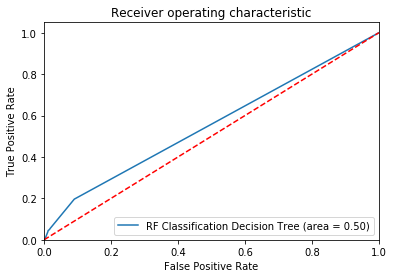

In [175]:
# Plotting the chart
import matplotlib.pyplot as plt
plt.figure()
plt.plot(fpr_log_rf, tpr_log_rf, label='RF Classification Decision Tree (area = %0.2f)' % rf_roc_auc_log_rf)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('RF_Classification_Logisitic_Regression_ROC')
plt.show()

In [176]:
# K-Fold Validation using Decision Tree Classifier
clf_log_rf = RandomForestClassifier(n_estimators=50, max_depth=5) #tree.DecisionTreeClassifier(splitter = "best", max_depth = 5)

import sklearn
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_validate
from sklearn import metrics

scores_log_rf = cross_validate(clf_log_rf, cleaned_data_wo_outcome_log, target_log, cv=10,
                        scoring=('roc_auc', 'precision','recall', 'accuracy'),
                        return_train_score=True)
print(scores_log_rf)

{'fit_time': array([0.64811563, 0.71012592, 0.53459835, 0.57845664, 0.56147242,
       0.53357267, 0.53756714, 0.58540702, 0.59240413, 0.54454589]), 'score_time': array([0.11568952, 0.07681203, 0.06480384, 0.06283069, 0.06984138,
       0.06385255, 0.06679773, 0.0658226 , 0.06183028, 0.06184101]), 'test_roc_auc': array([0.5471541 , 0.56104911, 0.5590981 , 0.56160271, 0.53984162,
       0.56261566, 0.53669776, 0.55484101, 0.54625847, 0.55577822]), 'train_roc_auc': array([0.55370595, 0.55222027, 0.55238462, 0.55210749, 0.55458464,
       0.5520739 , 0.55462355, 0.552932  , 0.55387646, 0.55281823]), 'test_precision': array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]), 'train_precision': array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]), 'test_recall': array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]), 'train_recall': array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]), 'test_accuracy': array([0.90044294, 0.90044294, 0.90063291, 0.90063291, 0.90063291,
       0.90042194, 0.90042194, 0.90042194, 0.900

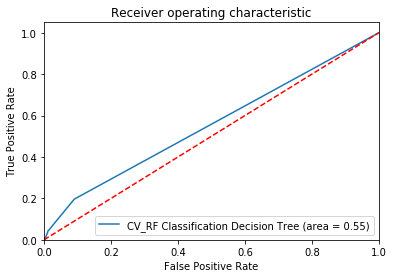

In [177]:
# Cross validated ROC/AUC chart
import matplotlib.pyplot as plt
from statistics import mean
plt.figure()
plt.plot(fpr_log_rf, tpr_log_rf, label='CV_RF Classification Decision Tree (area = %0.2f)' % mean(scores_log_rf["test_roc_auc"]))
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('CV_RF_Classification_Logisitic_Regression_ROC')
plt.show()

In [178]:
# Model using LogisticRegression instead of RandomForestClassifier
from sklearn.linear_model import LogisticRegression
classifier_log = LogisticRegression()
classifier_log

classifier_log.fit(X_train_log, y_train_log)

print(f'Training Score: {classifier_log.score(X_train_log, y_train_log)}')
print(f'Testing Score: {classifier_log.score(X_test_log, y_test_log)}')

Training Score: 0.8994964979888048
Testing Score: 0.9032992996371614


In [179]:
# Creating ROC/AUC chart
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
rf_roc_auc_log = roc_auc_score(y_test_log.values, classifier_log.predict(X_test_log))
fpr_log, tpr_log, thresholds_log = roc_curve(y_test_log.values, classifier_log.predict_proba(X_test_log)[:,1])

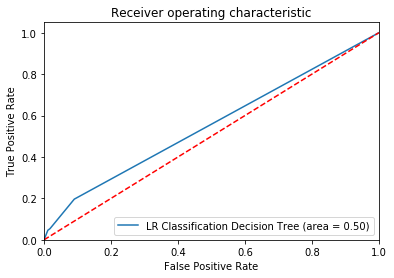

In [180]:
# Plotting ROC/AUC
import matplotlib.pyplot as plt
from statistics import mean
plt.figure()
plt.plot(fpr_log, tpr_log, label='LR Classification Decision Tree (area = %0.2f)' % rf_roc_auc_log)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('LR_Classification_Logisitic_Regression_ROC')
plt.show()

In [181]:
# K-Fold Validation LogisticRegression
clf_log = LogisticRegression()

import sklearn
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_validate
from sklearn import metrics

scores_log = cross_validate(clf_log, cleaned_data_wo_outcome_log, target_log, cv=10,
                        scoring=('roc_auc', 'precision','recall', 'accuracy'),
                        return_train_score=True)
print(scores_log)

{'fit_time': array([0.23138022, 0.19094276, 0.22439909, 0.20246053, 0.20843458,
       0.20644689, 0.20646691, 0.18953109, 0.1679132 , 0.15261459]), 'score_time': array([0.01396203, 0.01293778, 0.01396298, 0.01396871, 0.0139637 ,
       0.01496148, 0.01294899, 0.01072073, 0.01198006, 0.01295972]), 'test_roc_auc': array([0.54701663, 0.56013942, 0.55880617, 0.56135254, 0.53961185,
       0.5620036 , 0.54019045, 0.55461962, 0.54615323, 0.55514531]), 'train_roc_auc': array([0.55343683, 0.55193478, 0.55212931, 0.55184482, 0.55425801,
       0.55173255, 0.55416062, 0.55265   , 0.55349141, 0.5525341 ]), 'test_precision': array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]), 'train_precision': array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]), 'test_recall': array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]), 'train_recall': array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]), 'test_accuracy': array([0.90023202, 0.90044294, 0.90063291, 0.90063291, 0.90042194,
       0.90042194, 0.90042194, 0.90042194, 0.900

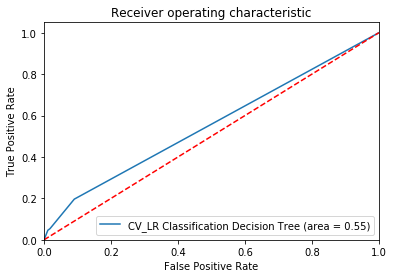

In [182]:
# Cross validated ROC/AU
import matplotlib.pyplot as plt
from statistics import mean
plt.figure()
plt.plot(fpr_log, tpr_log, label='CV_LR Classification Decision Tree (area = %0.2f)' % mean(scores_log["test_roc_auc"]))
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('CV_LR_Classification_Logisitic_Regression_ROC')
plt.show()

In [183]:
# Check the feature importance using the RandomForestClassifier model
sorted(zip(rf_log.feature_importances_, X_train_log), reverse=True)

[(0.6122500830861793, 'cm_renlfail'),
 (0.1897099789701435, 'cm_para'),
 (0.08919692856386252, 'cm_lymph'),
 (0.0730502243961451, 'new_osteo_adm'),
 (0.03579278498366959, 'cm_ulcer')]

## Decision Tree Classifier RFE

In [186]:
# Top 5 features
from sklearn.tree import DecisionTreeClassifier
from sklearn.feature_selection import RFE

clf = DecisionTreeClassifier(random_state=42)
trans = RFE(clf, n_features_to_select=5)
data_trans = trans.fit_transform(cleaned_data_wo_outcome, target)
columns_retained_RFE_5 = cleaned_data.iloc[:, 1:].columns[trans.get_support()].values
print(columns_retained_RFE_5)

['age' 'los' 'zipinc_qrtl' 'cc_index' 'frailty_risk_score']


In [26]:
# THIS PART IS TO RUN FOR THE PAPER TO SEE IF WE CAN HAVE RFECV AUTO SELECT FEATURES FOR US. FOR THE PAPER, NOT THE PROJECT, WILL TAKE A WHILE TO RUN!

# https://scikit-learn.org/stable/auto_examples/feature_selection/plot_rfe_with_cross_validation.html
# https://towardsdatascience.com/feature-selection-in-python-recursive-feature-elimination-19f1c39b8d15
# https://machinelearningmastery.com/rfe-feature-selection-in-python/

# import matplotlib.pyplot as plt
# # from sklearn.svm import SVC
# from sklearn.ensemble import RandomForestClassifier
# from sklearn.model_selection import StratifiedKFold
# from sklearn.feature_selection import RFECV
# from sklearn.datasets import make_classification

# # Create the RFE object and compute a cross-validated score.
# rfc = RandomForestClassifier(random_state=42)
# # The "accuracy" scoring is proportional to the number of correct
# # classifications
# rfecv = RFECV(estimator=rfc, step=1, cv=StratifiedKFold(5), #change to 5 afterwards
#               scoring='accuracy')
# rfecv.fit(cleaned_data_wo_outcome, target)

# print("Optimal number of features : %d" % rfecv.n_features_)

# # Plot number of features VS. cross-validation scores
# plt.figure()
# plt.xlabel("Number of features selected")
# plt.ylabel("Cross validation score (nb of correct classifications)")
# plt.plot(range(1, len(rfecv.grid_scores_) + 1), rfecv.grid_scores_)
# plt.show()

In [187]:
# Feature list from RFE results

data_selected = readm_data_df[['hnhc_patients', 'age', 'los', 'zipinc_qrtl', 'cc_index', 'frailty_risk_score']]

cleaned_data_selected = data_selected.dropna(axis='rows')
cleaned_data_selected

,hnhc_patients,age,los,zipinc_qrtl,cc_index,frailty_risk_score
0,0,89,4,4.0,2,4.7
3,0,48,4,3.0,0,0.5
4,1,65,5,2.0,0,5.7
9,0,51,3,4.0,0,2.8
10,0,22,6,2.0,0,3.8
...,...,...,...,...,...,...
94491,0,32,3,4.0,0,0.0
94492,0,54,4,4.0,0,0.0
94493,1,44,9,4.0,0,0.0
94496,0,52,2,1.0,2,1.5


In [188]:
# Grab outcome/label names after dropping na's/rows with na's
target_selected = cleaned_data_selected["hnhc_patients"]
target_names_selected = ["none", "hnhc"]
target_selected = target_selected.astype('int64')
target_selected

0        0
3        0
4        1
9        0
10       0
        ..
94491    0
94492    0
94493    1
94496    0
94497    0
Name: hnhc_patients, Length: 46685, dtype: int64

In [189]:
# Grab feature names after dropping na's/rows with na
cleaned_data_wo_outcome_selected = cleaned_data_selected.drop('hnhc_patients', axis=1)
featured_names_selected = cleaned_data_wo_outcome_selected.columns
featured_names_selected

Index(['age', 'los', 'zipinc_qrtl', 'cc_index', 'frailty_risk_score'], dtype='object')

In [190]:
# Hypertuning parameers with Random Forest Classifier
from sklearn.ensemble import RandomForestClassifier

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(cleaned_data_wo_outcome_selected, target_selected, random_state=42)

rf = RandomForestClassifier(n_estimators=200)

rf.fit(X_train, y_train)

print(f'Training Score: {rf.score(X_train, y_train)}')
print(f'Testing Score: {rf.score(X_test, y_test)}')

# Hypertuning parameters
from sklearn.model_selection import GridSearchCV
param_grid = {'n_estimators': [50, 100, 150, 200],
              'max_depth': [5, 10, 15]}

grid = GridSearchCV(rf,param_grid, verbose=3)

Training Score: 0.9934310113386456
Testing Score: 0.9089273474982865


In [191]:
# Printing out the grid for hypertuning
grid.fit(X_train, y_train)

Fitting 5 folds for each of 12 candidates, totalling 60 fits
[CV] max_depth=5, n_estimators=50 ....................................
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[CV] ........ max_depth=5, n_estimators=50, score=0.918, total=   1.0s
[CV] max_depth=5, n_estimators=50 ....................................
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.9s remaining:    0.0s
[CV] ........ max_depth=5, n_estimators=50, score=0.917, total=   0.9s
[CV] max_depth=5, n_estimators=50 ....................................
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.8s remaining:    0.0s
[CV] ........ max_depth=5, n_estimators=50, score=0.921, total=   0.9s
[CV] max_depth=5, n_estimators=50 ....................................
[CV] ........ max_depth=5, n_estimators=50, score=0.919, total=   0.9s
[CV] max_depth=5, n_estimators=50 ....................................
[CV] ........ max_depth=5, n_estimators=50, score=0.914, to

GridSearchCV(cv=None, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=200, n_jobs=None,
                                              oob_score=False,
                                              ra

In [192]:
# Print the best depth and estimator
print(grid.best_params_)
print(grid.best_score_)

{'max_depth': 5, 'n_estimators': 100}
0.9182874251101346


In [193]:
# Check the training and testing scores
print(f'Training Score: {grid.score(X_train, y_train)}')
grid.predict(X_test)
print(f'Testing Score: {grid.score(X_test, y_test)}')

Training Score: 0.9190586353640077
Testing Score: 0.917323509252913


In [194]:
# Creating ROC/AUC chart with hypertuned model
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
rf_roc_auc_rf = roc_auc_score(y_test.values, grid.predict(X_test))
fpr_rf, tpr_rf, thresholds_rf = roc_curve(y_test.values, grid.predict_proba(X_test)[:,1])

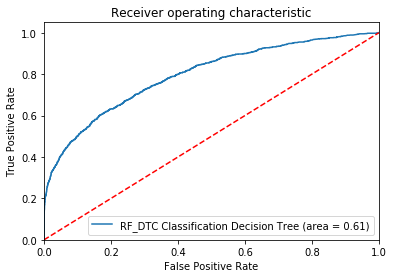

In [195]:
# Plotting the chart
import matplotlib.pyplot as plt
plt.figure()
plt.plot(fpr_rf, tpr_rf, label='RF_DTC Classification Decision Tree (area = %0.2f)' % rf_roc_auc_rf)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('RF_DTC_Classification_Logisitic_Regression_ROC')
plt.show()

In [196]:
# K-Fold Validation Decision Tree
clf = RandomForestClassifier(n_estimators=150, max_depth=5) #tree.DecisionTreeClassifier(splitter = "best", max_depth = 5)

import sklearn
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_validate
from sklearn import metrics

scores = cross_validate(clf, cleaned_data_wo_outcome_selected, target_selected, cv=10,
                        scoring=('roc_auc', 'precision','recall', 'accuracy'),
                        return_train_score=True)
print(scores)

{'fit_time': array([3.92467737, 3.24033642, 3.39196181, 3.48068976, 3.31810331,
       3.28222609, 3.26130772, 3.22139406, 3.31813526, 3.27225256]), 'score_time': array([0.21638703, 0.19649673, 0.19745207, 0.21345949, 0.20944309,
       0.21741962, 0.20543265, 0.20143104, 0.19550371, 0.20445967]), 'test_roc_auc': array([0.78142859, 0.76543589, 0.77521383, 0.80283831, 0.76537911,
       0.79704212, 0.78782266, 0.78689861, 0.78742177, 0.80152215]), 'train_roc_auc': array([0.79204932, 0.79365783, 0.79399796, 0.78877236, 0.79421151,
       0.79176059, 0.79065826, 0.79123298, 0.79104888, 0.79117915]), 'test_precision': array([0.78991597, 0.74358974, 0.79310345, 0.86029412, 0.79166667,
       0.82352941, 0.81102362, 0.85606061, 0.79354839, 0.79591837]), 'train_precision': array([0.83472454, 0.83156173, 0.81795717, 0.83420593, 0.82996633,
       0.82656514, 0.8285473 , 0.82367758, 0.82343096, 0.8248114 ]), 'test_recall': array([0.20215054, 0.18709677, 0.24731183, 0.2516129 , 0.20430108,
     

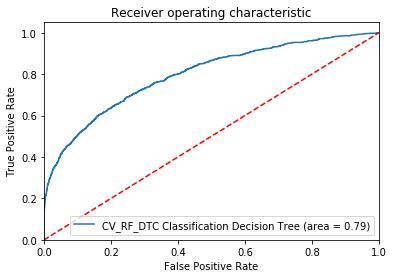

In [197]:
# Cross validated ROC/AU
import matplotlib.pyplot as plt
from statistics import mean
plt.figure()
plt.plot(fpr, tpr, label='CV_RF_DTC Classification Decision Tree (area = %0.2f)' % mean(scores["test_roc_auc"]))
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('CV_RF_DTC_Classification_Logisitic_Regression_ROC')
plt.show()

In [198]:
# Using logistic regression and k-fold validation
from sklearn.linear_model import LogisticRegression
classifier = LogisticRegression()
classifier

classifier.fit(X_train, y_train)

print(f'Training Score: {classifier.score(X_train, y_train)}')
print(f'Testing Score: {classifier.score(X_test, y_test)}')

Training Score: 0.9177733984520036
Testing Score: 0.917323509252913


In [199]:
# Creating ROC/AUC chart
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
rf_roc_auc = roc_auc_score(y_test.values, classifier.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test.values, classifier.predict_proba(X_test)[:,1])

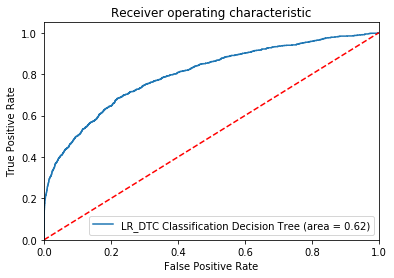

In [200]:
# Plotting chart
import matplotlib.pyplot as plt
from statistics import mean
plt.figure()
plt.plot(fpr, tpr, label='LR_DTC Classification Decision Tree (area = %0.2f)' % rf_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('LR_DTC_Classification_Logisitic_Regression_ROC')
plt.show()

In [201]:
# K-Fold Validation LogisticRegression
clf = LogisticRegression()

import sklearn
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_validate
from sklearn import metrics

scores = cross_validate(clf, cleaned_data_wo_outcome_selected, target_selected, cv=10,
                        scoring=('roc_auc', 'precision','recall', 'accuracy'),
                        return_train_score=True)
print(scores)

{'fit_time': array([0.20797706, 0.20604157, 0.29418588, 0.26129913, 0.25030446,
       0.28124762, 0.43037963, 0.26027369, 0.19873524, 0.23938346]), 'score_time': array([0.0129602 , 0.01396298, 0.01595855, 0.01496267, 0.01795173,
       0.01698399, 0.01298261, 0.01202559, 0.01299715, 0.012995  ]), 'test_roc_auc': array([0.78883015, 0.76731249, 0.7698894 , 0.81183793, 0.78546673,
       0.79088573, 0.79513866, 0.79107311, 0.78794313, 0.79869259]), 'train_roc_auc': array([0.78914104, 0.79164575, 0.79117502, 0.78691871, 0.78997671,
       0.78889382, 0.78862672, 0.78930692, 0.78929842, 0.78826266]), 'test_precision': array([0.75      , 0.69343066, 0.76582278, 0.7791411 , 0.73943662,
       0.78343949, 0.75159236, 0.82550336, 0.75287356, 0.73809524]), 'train_precision': array([0.76082328, 0.76223776, 0.75675676, 0.75689405, 0.75671853,
       0.7555876 , 0.75849602, 0.7537797 , 0.75609756, 0.76397967]), 'test_recall': array([0.23225806, 0.20430108, 0.26021505, 0.27311828, 0.22580645,
     

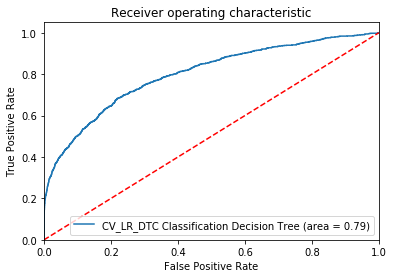

In [202]:
# Cross validated ROC/AU
import matplotlib.pyplot as plt
from statistics import mean
plt.figure()
plt.plot(fpr, tpr, label='CV_LR_DTC Classification Decision Tree (area = %0.2f)' % mean(scores["test_roc_auc"]))
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('CV_LR_DTC_Classification_Logisitic_Regression_ROC')
plt.show()

In [203]:
# Check the feature importance using the RandomForestClassifier model
sorted(zip(rf.feature_importances_, X_train), reverse=True)

[(0.3193676153994176, 'los'),
 (0.28314877706365804, 'frailty_risk_score'),
 (0.2802071307952344, 'age'),
 (0.060037542081733196, 'zipinc_qrtl'),
 (0.05723893465995665, 'cc_index')]

# XGBoost Classifier Model

In [204]:
# XGBClassifier
from sklearn import  metrics, model_selection
from xgboost.sklearn import XGBClassifier
params = {
    'objective': 'binary:logistic',
    'max_depth': 3,
    'learning_rate': 0.2,
    'silent': 1.0,
    'n_estimators': 100,
    'min_child_weight': 0.5,
    'gamma': 1
}
model = XGBClassifier(**params).fit(X_train, y_train)

# Use the model to make predictions with the test data
y_pred = model.predict(X_test)
# How did our model perform?
count_misclassified = (y_test != y_pred).sum()
print('Misclassified samples: {}'.format(count_misclassified))
accuracy = metrics.accuracy_score(y_test, y_pred)
print('Accuracy: {:.2f}'.format(accuracy))

[21:08:40] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.2.0\src\learner.cc:516: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


Misclassified samples: 962
Accuracy: 0.92


In [205]:
# Score
model.score(X_test,y_test)

0.9175805346127485

In [207]:
# Creating ROC/AUC chart
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve

# classifier = XGBClassifier(**params)

rf_roc_auc = roc_auc_score(y_test.values, model.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test.values, model.predict_proba(X_test)[:,1])

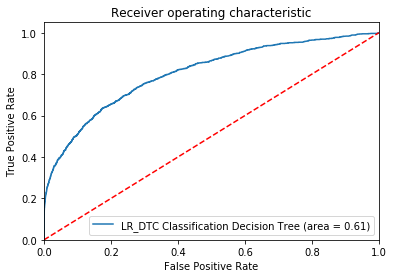

In [208]:
# Cross validated ROC/AU
import matplotlib.pyplot as plt
from statistics import mean
plt.figure()
plt.plot(fpr, tpr, label='LR_DTC Classification Decision Tree (area = %0.2f)' % rf_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('LR_DTC_Classification_Logisitic_Regression_ROC')
plt.show()

In [209]:
# K-Fold Validation LogisticRegression
clf = XGBClassifier(**params)

import sklearn
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_validate
from sklearn import metrics

scores = cross_validate(clf, cleaned_data_wo_outcome_selected, target_selected, cv=10,
                        scoring=('roc_auc', 'precision','recall', 'accuracy'),
                        return_train_score=True, silent)
print(scores)

[21:09:27] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.2.0\src\learner.cc:516: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:09:29] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.2.0\src\learner.cc:516: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:09:32] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.2.0\src\learner.cc:516: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings bu

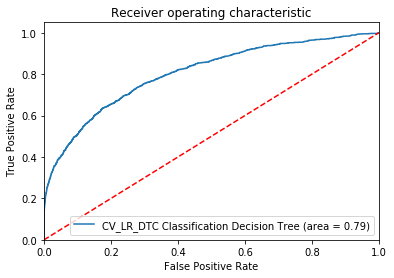

In [210]:
# Cross validated ROC/AU
import matplotlib.pyplot as plt
from statistics import mean
plt.figure()
plt.plot(fpr, tpr, label='CV_LR_DTC Classification Decision Tree (area = %0.2f)' % mean(scores["test_roc_auc"]))
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('CV_LR_DTC_Classification_Logisitic_Regression_ROC')
plt.show()

# Using AutoML to see if our scores are close to TPOT

In [136]:
# Check tpot version
import tpot
print('tpot: %s' % tpot.__version__)

tpot: 0.11.6.post1


In [137]:
# TPOT Classification (AutoML)
from sklearn.datasets import make_classification
from sklearn.model_selection import RepeatedStratifiedKFold
from tpot import TPOTClassifier

In [138]:
# Define model evaluation
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=42)
# Define search
model = TPOTClassifier(generations=5, population_size=50, cv=cv, scoring='accuracy', verbosity=2, random_state=42, n_jobs=-1)
# Perform the search
model.fit(X_train, y_train)
# Export the best model
model.export('tpot_best_model_5_features.py')


Generation 1 - Current best internal CV score: 0.918316112450643

Generation 2 - Current best internal CV score: 0.918392256695525

Generation 3 - Current best internal CV score: 0.9187730513263921

Generation 4 - Current best internal CV score: 0.9187730513263921

Generation 5 - Current best internal CV score: 0.9187730513263921

Best pipeline: LinearSVC(PolynomialFeatures(input_matrix, degree=2, include_bias=False, interaction_only=False), C=25.0, dual=False, loss=squared_hinge, penalty=l1, tol=0.0001)
